# __Visualisation pandas method plt()__

# LINEPLOT

Text(0, 0.5, 'Total sales')

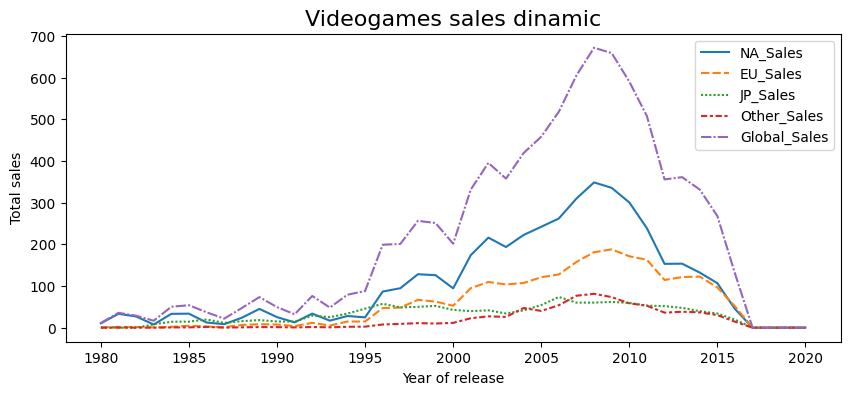

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

vg_data = pd.read_csv('data/Video_Games_Sales_as_at_22_Dec_2016.csv')
dinamic_by_region = vg_data[
        ['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales', 'Year_of_Release']
    ].groupby('Year_of_Release').sum()

fig = plt.figure(figsize=(10, 4))
lineplot = sns.lineplot(data=dinamic_by_region)
lineplot.set_title('Videogames sales dinamic', fontsize=16)
lineplot.set_xlabel('Year of release')
lineplot.set_ylabel('Total sales')

# HISTOGRAM

Text(0, 0.5, 'Тип объекта')

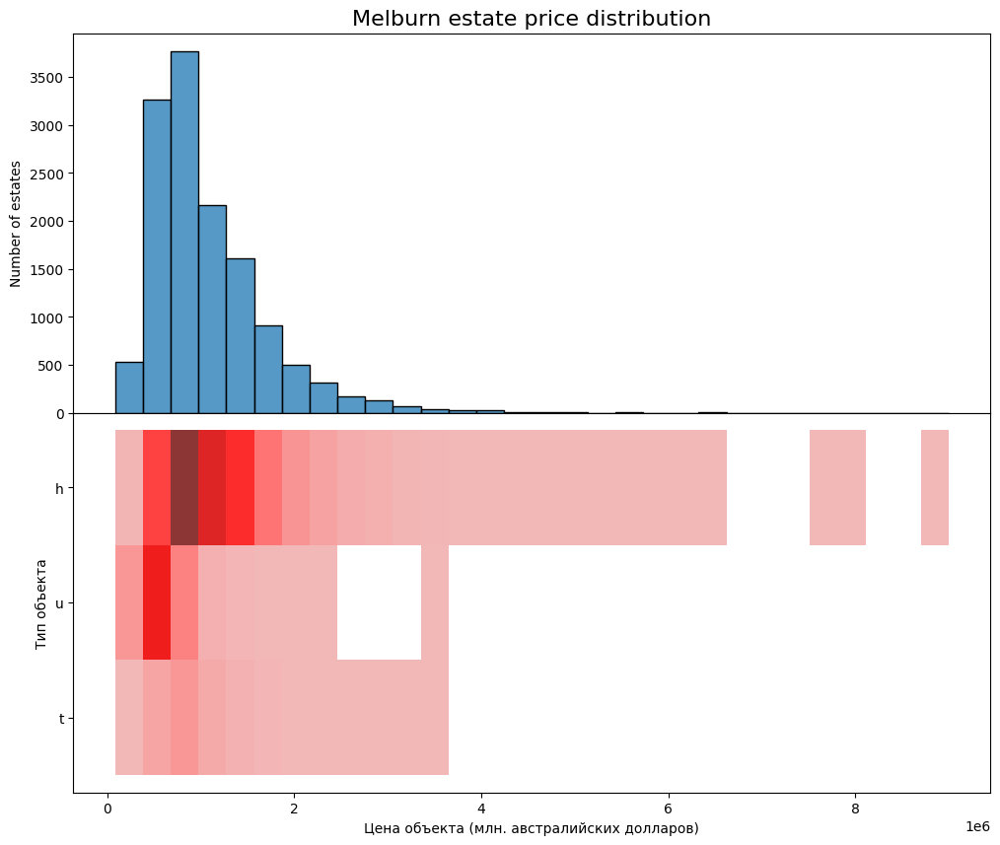

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

melb_data = pd.read_csv('data/melb_data.csv')

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))
plt.subplots_adjust(hspace=.0)

histplot1 = sns.histplot(
    data=melb_data, 
    x='Price', 
    bins=30,
    ax=axes[0],
)
histplot1.set_title('Melburn estate price distribution', fontsize=16)
histplot1.set_xlabel('Estate price (mln AUZ dollars)')
histplot1.set_ylabel('Number of estates')

histplot2 = sns.histplot(
    data=melb_data,
    x='Price',
    y='Type',
    bins=30,
    color='red',
    ax=axes[1]
)
histplot2.set_xlabel('Цена объекта (млн. австралийских долларов)')
histplot2.set_ylabel('Тип объекта')

# SCATTERPLOT

Text(0, 0.5, 'Длина крыльев')

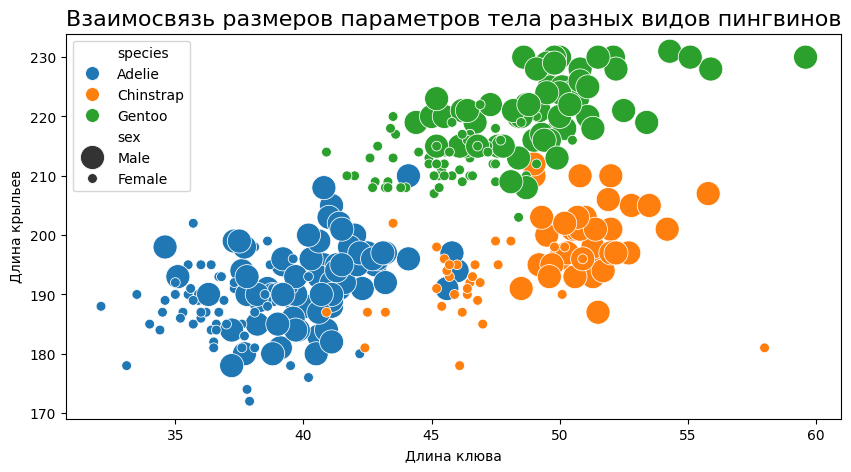

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

penguins_df = sns.load_dataset("penguins") # access to a test dataset of seaborrn module

fig = plt.figure(figsize=(10, 5))

scatterplot = sns.scatterplot(
    data=penguins_df,
    x='bill_length_mm',
    y='flipper_length_mm',
    hue='species',
    s=100,
    size='sex',
    sizes=(50, 300)

)
scatterplot.set_title('Взаимосвязь размеров параметров тела разных видов пингвинов', fontsize=16)
scatterplot.set_xlabel('Длина клюва')
scatterplot.set_ylabel('Длина крыльев')


# PIE CHART

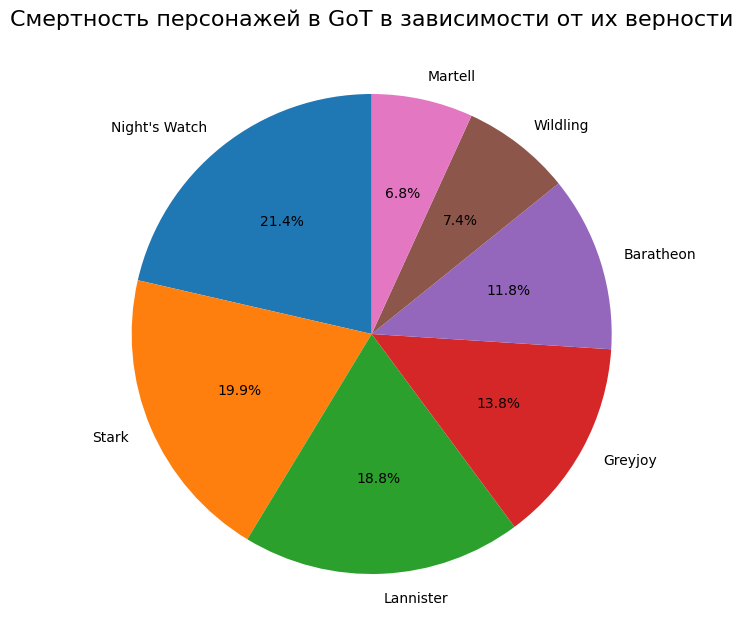

In [6]:
import matplotlib.pyplot as plt
import pandas as pd

game_of_thrones_df = pd.read_csv('data/character-deaths.csv')
game_of_thrones_df['Allegiances'] = game_of_thrones_df['Allegiances'].str.replace('House ', '')
fig = plt.figure(figsize=(12, 6))
ax = fig.add_axes((1, 1, 1, 1))
deaths_count = game_of_thrones_df['Allegiances'].value_counts().sort_values(ascending=False).head(7)
pie = ax.pie(
    deaths_count,
    labels=deaths_count.index,
    autopct='%1.1f%%',
    startangle=90
)
title = ax.set_title('Смертность персонажей в GoT в зависимости от их верности', fontsize=16)
plt.show(pie)

# BAR CHART

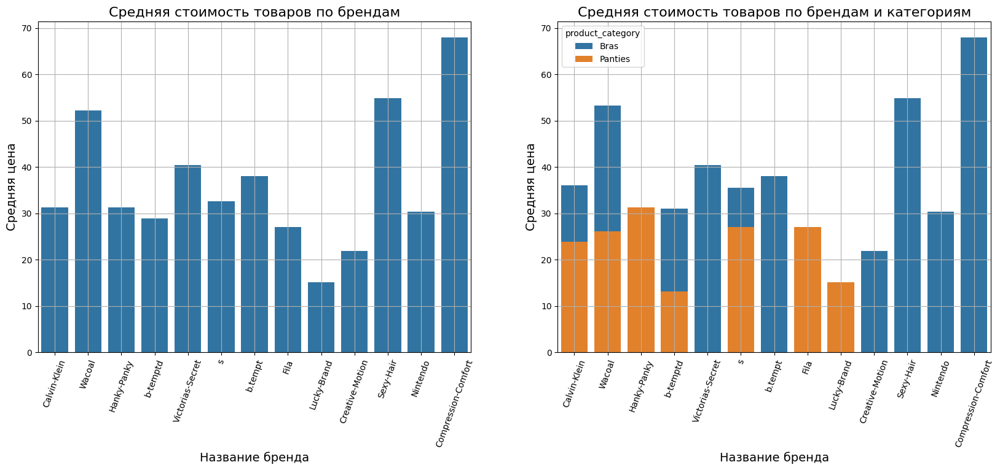

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

amazon_data = pd.read_csv('data/amazon_com.csv')

def replace_url(brand_name):
    if 'ref=' in brand_name:
        if 'Calvin' in brand_name:
            return 'Calvin-Klein'
        elif 'Wacoal' in brand_name:
            return 'Wacoal'
        else:
            return 'b.tempt'
    else:
        return brand_name
    
amazon_data['brand_name'] = amazon_data['brand_name'].apply(replace_url)
amazon_data['price'] = amazon_data['price'].str.replace('$', '').astype('float64')
amazon_data['brand_name'].unique()
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 7))
barplot1 = sns.barplot(
    data=amazon_data,
    x='brand_name',
    y='price',
    orient='v',
    ax = axes[0],
    errorbar=None
)
barplot1.tick_params(axis='x', rotation=70);
barplot1.set_title('Средняя стоимость товаров по брендам', fontsize=16);
barplot1.set_xlabel('Название бренда', fontsize=14);
barplot1.set_ylabel('Средняя цена', fontsize=14);
barplot1.grid()

barplot2 = sns.barplot(
    data=amazon_data,
    x='brand_name',
    y='price',
    hue='product_category',
    orient='v',
    ax = axes[1],
    errorbar=None,
    dodge=False
)
barplot2.tick_params(axis='x', rotation=70);
barplot2.set_title('Средняя стоимость товаров по брендам и категориям', fontsize=16);
barplot2.set_xlabel('Название бренда', fontsize=14);
barplot2.set_ylabel('Средняя цена', fontsize=14);
barplot2.grid()

# HEATMAP

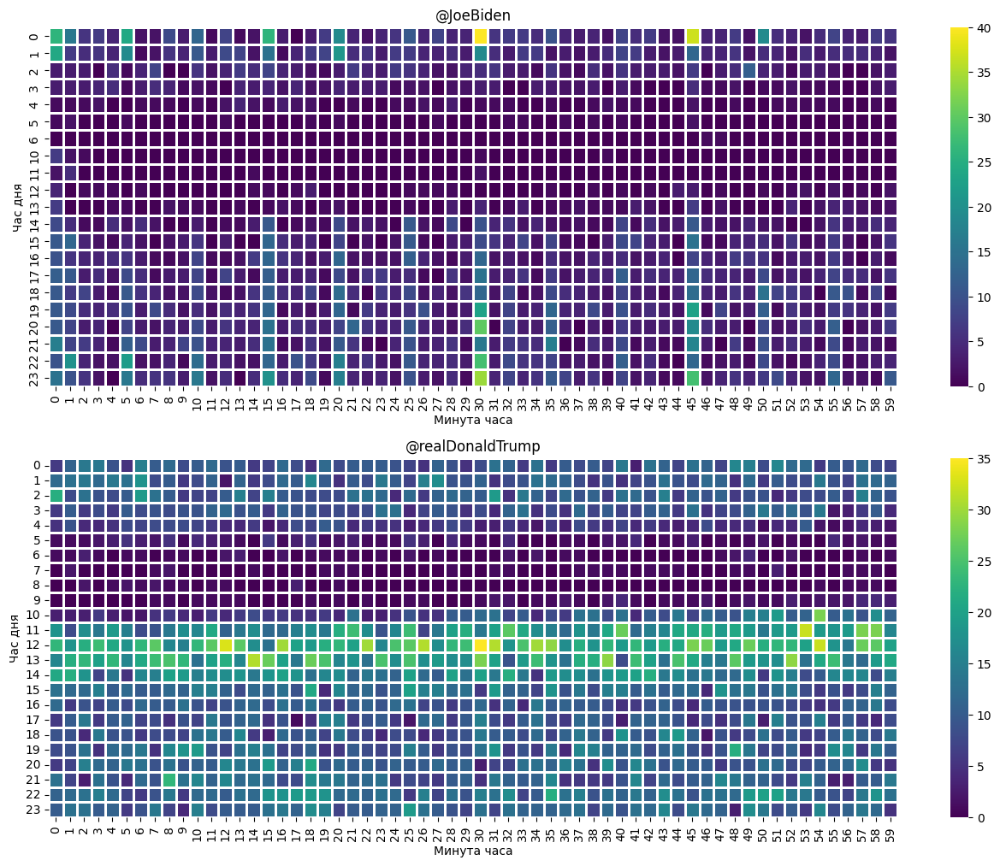

In [8]:
tweets_df = pd.read_csv("https://bit.ly/3cngqgL", 
                 parse_dates=['date_utc'], 
                 dtype={'hour_utc':int,'minute_utc':int,'id':str}
                )
g = tweets_df.groupby(['hour_utc','minute_utc','username'])
tweet_cnt = g.id.nunique()
jb_tweet_cnt = tweet_cnt.loc[:,:,'JoeBiden'].reset_index().pivot_table(index='hour_utc', columns='minute_utc', values='id', fill_value=0)
dt_tweet_cnt = tweet_cnt.loc[:,:,'realDonaldTrump'].reset_index().pivot_table(index='hour_utc', columns='minute_utc', values='id', fill_value=0)
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(16, 12))
jb_heatmap = sns.heatmap(
    jb_tweet_cnt,
    linewidth=1,
    linecolor='w',
    cmap='viridis',
    ax = axes[0]
)
jb_heatmap.set_title('@JoeBiden');
jb_heatmap.set_xlabel('Минута часа');
jb_heatmap.set_ylabel('Час дня');

dt_heatmap = sns.heatmap(
    dt_tweet_cnt,
    linewidth=1,
    linecolor='w',
    cmap='viridis',
    ax = axes[1]
)

dt_heatmap.set_title('@realDonaldTrump');
dt_heatmap.set_xlabel('Минута часа');
dt_heatmap.set_ylabel('Час дня');


Text(0, 0.5, 'Тип пользователя')

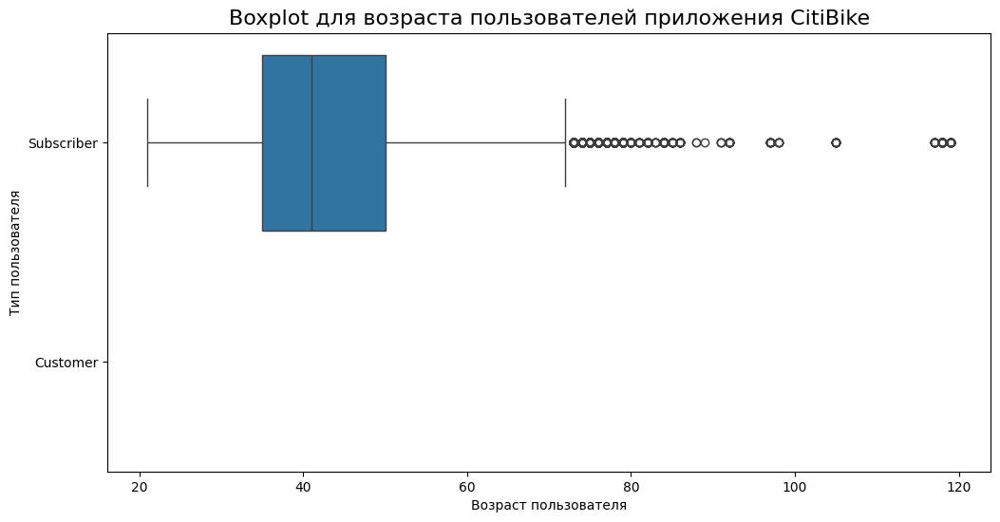

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

citibike_df = pd.read_csv('data/201306-citibike-tripdata.csv')
citibike_df['age'] = 2018 - citibike_df['birth year']

fig = plt.figure(figsize=(12, 6))
boxplot = sns.boxplot(data=citibike_df, x='age', y='usertype')
boxplot.set_title('Boxplot для возраста пользователей приложения CitiBike', fontsize=16)
boxplot.set_xlabel('Возраст пользователя')
boxplot.set_ylabel('Тип пользователя')

COVID DATA

In [10]:
vaccinations_data = pd.read_csv('data/country_vaccinations.csv')
vaccinations_data = vaccinations_data[
    ['country', 'date', 'total_vaccinations', 
     'people_vaccinated', 'people_vaccinated_per_hundred',
     'people_fully_vaccinated', 'people_fully_vaccinated_per_hundred',
     'daily_vaccinations', 'vaccines']
]
vaccinations_data.head()

covid_data = pd.read_csv('data/covid_data.csv')
display(covid_data.head())



,date,province/state,country,confirmed,deaths,recovered
0,01/22/2020,Anhui,China,1.0,0.0,0.0
1,01/22/2020,Beijing,China,14.0,0.0,0.0
2,01/22/2020,Chongqing,China,6.0,0.0,0.0
3,01/22/2020,Fujian,China,1.0,0.0,0.0
4,01/22/2020,Gansu,China,0.0,0.0,0.0


data prep

In [11]:
# data not by country but by region, find by county
covid_data = covid_data.groupby(['date', 'country'],
                                as_index=False,
    )[['confirmed', 'deaths','recovered']].sum()
display(covid_data.head())
# convert date to datetime format
covid_data['date'] = pd.to_datetime(covid_data['date'])
display(covid_data.head())

# active cases = confirmed - deaths - recovered
covid_data['active'] = covid_data['confirmed'] - covid_data['deaths'] - covid_data['recovered']
display(covid_data.head())

# delta confirmed by countries
covid_data = covid_data.sort_values(by=['country','date'])
covid_data['daily_confirmed'] = covid_data.groupby('country')['confirmed'].diff() 
covid_data['daily_deaths'] = covid_data.groupby('country')['deaths'].diff()
covid_data['daily_recovered'] = covid_data.groupby('country')['recovered'].diff()
covid_data.head(20)

,date,country,confirmed,deaths,recovered
0,01/01/2021,Afghanistan,51526.0,2191.0,41727.0
1,01/01/2021,Albania,58316.0,1181.0,33634.0
2,01/01/2021,Algeria,99897.0,2762.0,67395.0
3,01/01/2021,Andorra,8117.0,84.0,7463.0
4,01/01/2021,Angola,17568.0,405.0,11146.0


,date,country,confirmed,deaths,recovered
0,2021-01-01,Afghanistan,51526.0,2191.0,41727.0
1,2021-01-01,Albania,58316.0,1181.0,33634.0
2,2021-01-01,Algeria,99897.0,2762.0,67395.0
3,2021-01-01,Andorra,8117.0,84.0,7463.0
4,2021-01-01,Angola,17568.0,405.0,11146.0


,date,country,confirmed,deaths,recovered,active
0,2021-01-01,Afghanistan,51526.0,2191.0,41727.0,7608.0
1,2021-01-01,Albania,58316.0,1181.0,33634.0,23501.0
2,2021-01-01,Algeria,99897.0,2762.0,67395.0,29740.0
3,2021-01-01,Andorra,8117.0,84.0,7463.0,570.0
4,2021-01-01,Angola,17568.0,405.0,11146.0,6017.0


,date,country,confirmed,deaths,recovered,active,daily_confirmed,daily_deaths,daily_recovered
11337,2020-02-24,Afghanistan,1.0,0.0,0.0,1.0,NaN,NaN,NaN
11570,2020-02-25,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0
11807,2020-02-26,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0
12051,2020-02-27,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0
12299,2020-02-28,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0
12555,2020-02-29,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0
12619,2020-03-01,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0
12882,2020-03-02,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0
13152,2020-03-03,Afghanistan,2.0,0.0,0.0,2.0,1.0,0.0,0.0
13426,2020-03-04,Afghanistan,4.0,0.0,0.0,4.0,2.0,0.0,0.0


In [12]:
vaccinations_data['date'] = pd.to_datetime(vaccinations_data['date'])
vaccinations_data.head()

,country,date,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines
0,Afghanistan,2021-02-22,0.0,0.0,0.0,NaN,NaN,NaN,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
1,Afghanistan,2021-02-23,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
2,Afghanistan,2021-02-24,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
3,Afghanistan,2021-02-25,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
4,Afghanistan,2021-02-26,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."


In [13]:
covid_data['date'].min() # 2020-01-22
covid_data['date'].max() # 2021-05-29

vaccinations_data['date'].min() # 2020-12-02
vaccinations_data['date'].max() # 2021-09-06

# merge tables by left 
covid_df = covid_data.merge(right=vaccinations_data, how='left')

# covid_df data quantity
covid_df.shape

# death_rate and recovery_rate
covid_df['death_rate'] = covid_df['deaths']/covid_df['confirmed']*100
covid_df['recovery_rate'] = covid_df['recovered']/covid_df['confirmed']*100
covid_df.head()

# max death_rate in US over the period
mask = covid_df['country'] == 'United States'
print(round(covid_df[mask]['death_rate'].max(), 2))

# mean recovery rate in Russia
mask1 = covid_df['country'] == 'Russia'
round(covid_df[mask1]['recovery_rate'].mean(), 2)



7.19


67.06

## __Visualisation with Pandas__

# plot()

### to create simple graphs and charts in Pandas

* __x__ — vlues on x
* __y__ — values on y 
* __figsize__ — figure size, tuple (width, heigth) in inches 
* __kind__ — type of visualisation:
    'line' default
    'bar' 
    'barh' 
    'hist' 
    'box' 
    'pie' 
    'scatter'
* __grid__ — visible grid (default=False);
* __legend__ — visible legend (default=False);
* __title__ — title
* __xlable__ & __ylable__ names for the data on x and y, for x by default is index
* __color__ — colour, can be a list ['orange','purple']
* __lw__ for type line, (line width) width of the line on the graph
* __bins__ for type hist, to define how many groups of values (bars)
* __colormap__ for type bar, chooses the colormap, [see more](https://matplotlib.org/stable/users/explain/colors/colormaps.html)


[more info](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html)

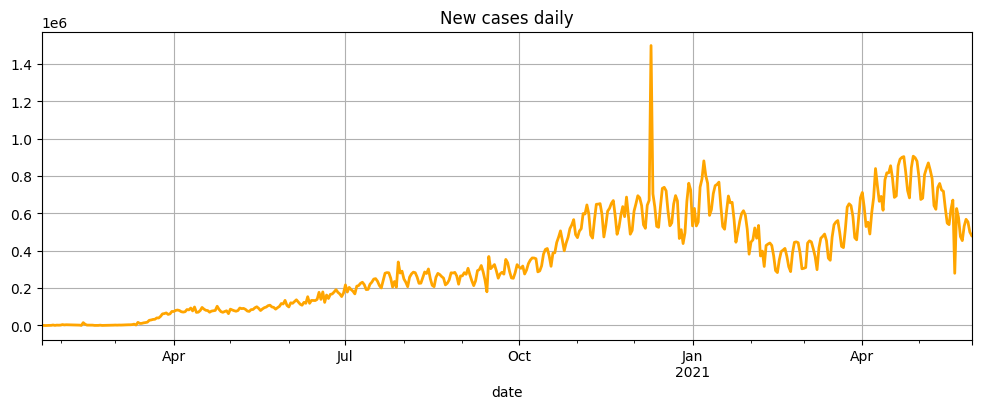

In [14]:
# linegraph showing new cases in time

grouped_cases = covid_df.groupby('date')['daily_confirmed'].sum() 
grouped_cases.plot( 
    kind='line', 
    figsize=(12,4),
    title='New cases daily',
    grid=True,
    lw=2,
    color='orange'
    ); # ; after the declaration commands not to show technical info of the graph

# didn't define x and y, because the date is a Series, y=column, x=index

<Axes: title={'center': 'Distribution of new cases worldwide'}, ylabel='Frequency'>

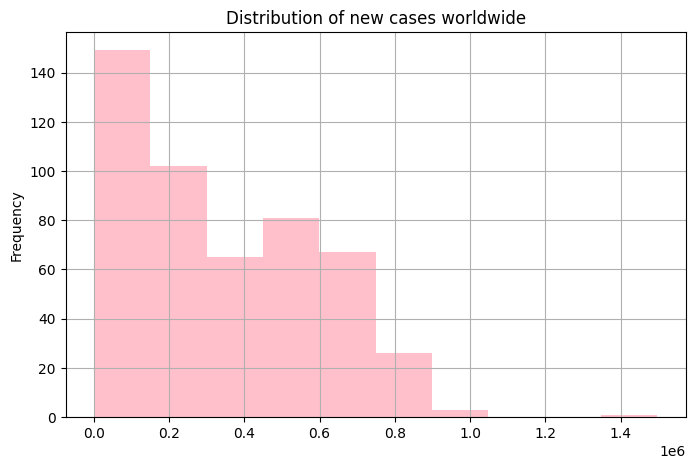

In [15]:
# histogram new cases 

grouped_cases.plot(
    kind='hist',
    figsize=(8,5),
    title='Distribution of new cases worldwide',
    grid=True,
    color='pink',
    bins=10
)

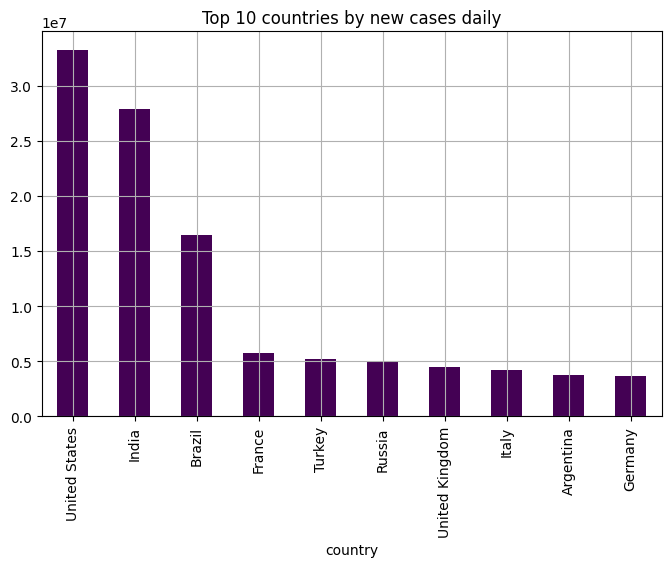

In [16]:
# bar graph top 10 countries by new cases daily

grouped_country = covid_df.groupby(['country'])['confirmed'].last()
grouped_country = grouped_country.nlargest(10)
grouped_country.plot(
    kind='bar',
    figsize=(8,5),
    title='Top 10 countries by new cases daily',
    grid=True,
    colormap='viridis'
);

<Axes: title={'center': 'relation between new cases and deaths in top 10'}, xlabel='country'>

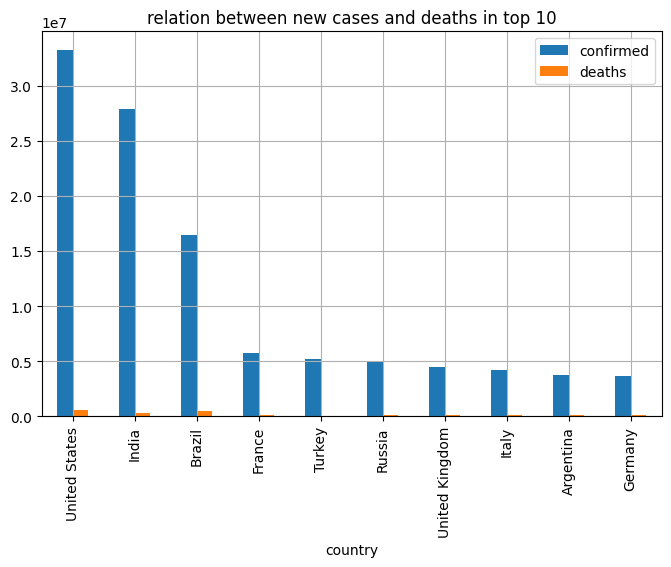

In [17]:
# bargraph relation between new cases and deaths in the same top 10 countries
grouped_country = covid_df.groupby('country')[['confirmed', 'deaths']].last()
grouped_country = grouped_country.nlargest(10, columns='confirmed')
grouped_country.plot(
    kind='bar',
    figsize=(8,5),
    title='relation between new cases and deaths in top 10',
    grid=True,
)

<Axes: title={'center': 'blabla'}, xlabel='country', ylabel='million ppl'>

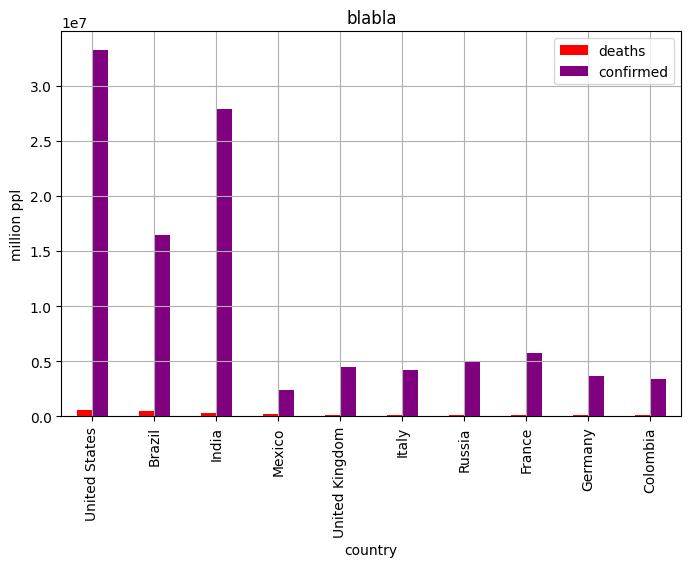

In [18]:
# top countries by deaths with two bars death and confirmed
grouped_country = covid_df.groupby('country')[['deaths', 'confirmed']].last()
grouped_country = grouped_country.nlargest(10, columns='deaths')
grouped_country.plot(
    kind='bar',
    figsize=(8,5),
    title='blabla',
    ylabel='million ppl',
    grid=True,
    color=['red', 'purple']
)

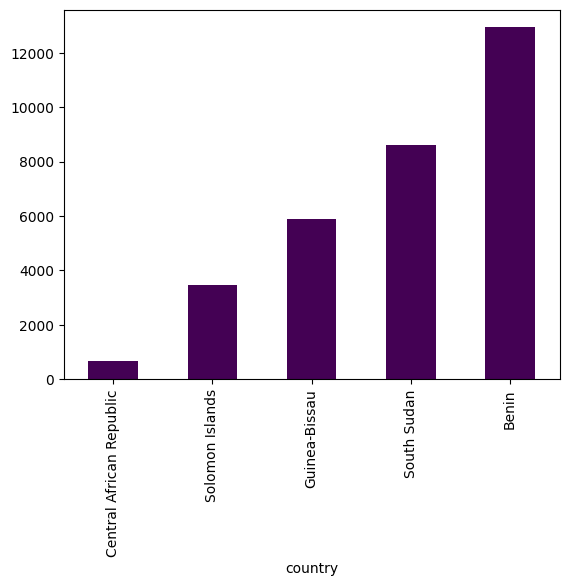

In [19]:
# 5 countries with the lowest amount of vaccinated ppl
covid_df.groupby(['country'])['total_vaccinations'].last().nsmallest(5).plot(kind='bar', colormap='viridis');

# __Visualisation matplotlib with pyplot__

# matplotlib.pyplot

for better display on laptops use __%matplotlib inline__

for better display with dark-theme in VS us __plt.style.use('default')__

plt.figure(figsize= (n,m)) in inches
fig.add_axes = ([a,b,c,d]) figure starts at a width b height and ends at c width and d height

## Overview

fig = __plt.figure__(figsize=(n,m), facecolor='color', edgecolor='color') # create a figure of a specific size, colours are None by default.
axes = __fig.add_axes__([0, 0, 1, 1]) # create axes on the figure relative to the left bottom corner
* __axes.scatter()__ # scattered dots chart. It has the following parameters:
    x, y: values for axes x and y
    s: size
    marker: ‘o’, ‘^'
    c: color
* __axes.pie()__ # pie chart. It has the following parameters:
    x: values for the pie chart
    labels: labels for the used values
    autopct: defines how percentage will be presented, e.g. “%.1f%%”
    explode: margin from center for each x value
* __axes.plot()__ # line chart. It has the following parameters:
Series’ index is shown on axis x, values on axis y
    label: label of the line
    lw: line width
    linestyle: e.g. ‘dashed’
* __axes.bar()__ # bar chart. It has the following parameters:
    x: names of categories
    height: sequence of values for the bars
    width: width of the bars
    color: color
* __axes.hist()__
    x — data 
    bins — number of bins
    orientation — default= 'vertical'
    color — color

    more details below


# plt.title('text)

to add a title

# plt.xlabel('text1', fontweight='bold')
# plt.ylabel('text2', style='italic', loc='bottom')

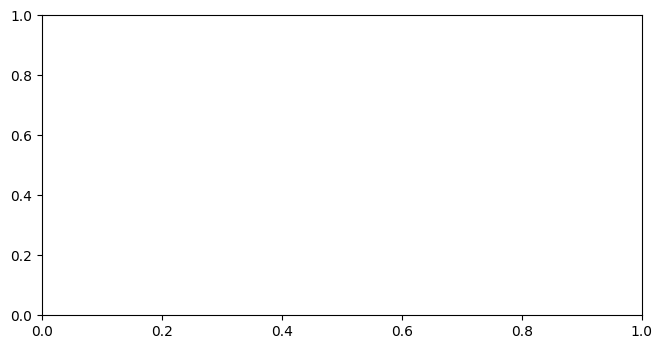

In [20]:
import matplotlib.pyplot as plt
%matplotlib inline

fig = plt.figure(figsize=(6,3))
axes = fig.add_axes([0,0,1,1]) 

## .scatter() 

* __x, y__ — values to show on x and y axes respectively 
* __s__ — marker size
* __marker__ — marker shape  ('o' — dots, '^' — triangles)
* __c__ — marker colour 

[more info](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.scatter.html)

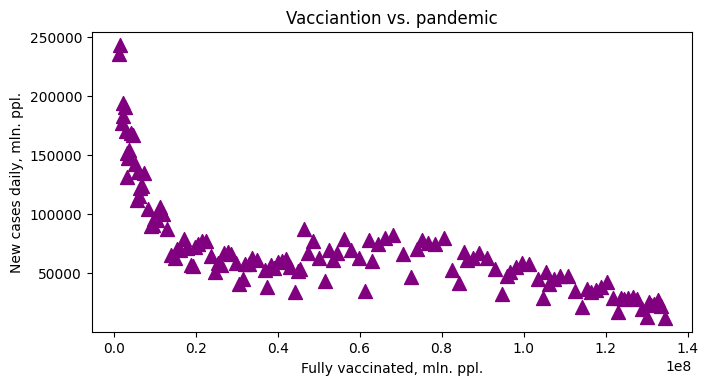

In [21]:
# Scatterplot: Effect of completed vaccination on the new cases in the US

us_data = covid_df[covid_df['country'] == 'United States']
fig = plt.figure(figsize=(6,3))
axes = fig.add_axes([0,0,1,1])
title = plt.title('Vacciantion vs. pandemic')
xlabel, ylabel = plt.xlabel('Fully vaccinated, mln. ppl.'), plt.ylabel('New cases daily, mln. ppl.')
axes.scatter(
    x=us_data['people_fully_vaccinated'], 
    y=us_data['daily_confirmed'],
    s=100,
    marker='^',
    c='purple'
    );

## pie()

* __x__ — values to plot 
* __labels__ — list, default: None, A sequence of strings providing the labels for each wedge
* __autopct__ — format of shares representations on the chart (ex., '%.1f%%' rounded by 0.0 and the output will show "%")
* __explode__ — array-like, default: None, If not None, is a len(x) array which specifies the fraction of the radius with which to offset each wedge.
* __colors__ -  color or array-like of color, default: None, A sequence of colors through which the pie chart will cycle. If None, will use the colors in the currently active cycle.
* __shadow__ - bool or dict, default: False, If bool, whether to draw a shadow beneath the pie. If dict, draw a shadow passing the properties in the dict to Shadow.

[more info](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.pie.html)

ТОП-10 комбинаций вакцин (vaccines) по распространённости мы находим с помощью метода value_counts(). Круговую диаграмму строим на полученных значениях, метки для каждого значения — индексы промежуточной таблицы. Будем отображать доли в процентах и округлять их до одного знака после запятой. Самую распространённую вакцину сместим на 10 % от центра:



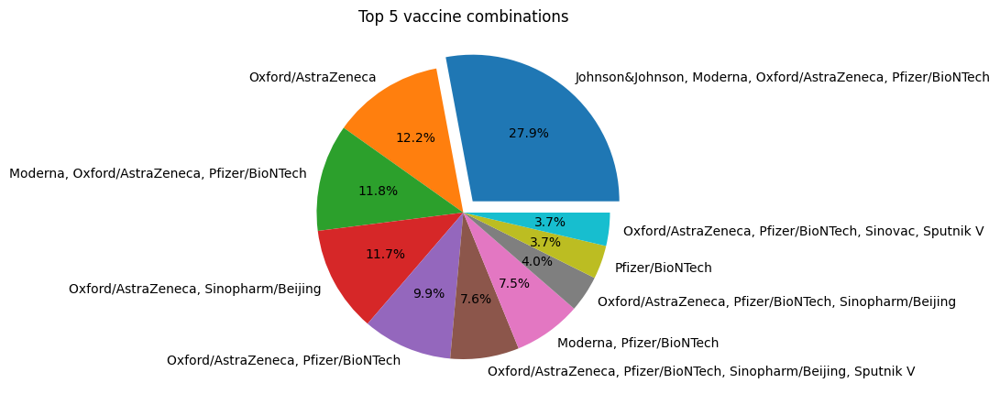

In [22]:
#  Piechart: Top 10 vaccines

vaccines = covid_df['vaccines'].value_counts()[:10]
fig = plt.figure(figsize=(4,4))
axes = fig.add_axes([0,0,1,1])
title = plt.title('Top 5 vaccine combinations')
axes.pie(
    x=vaccines,
    labels=vaccines.index,
    autopct='%.1f%%',
    explode=[0.1, 0,0,0,0,0,0,0,0,0]
    );


country
Afghanistan    Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...
Albania        Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac, ...
Algeria         Oxford/AstraZeneca, Sinopharm/Beijing, Sputnik V
Andorra                      Oxford/AstraZeneca, Pfizer/BioNTech
Angola                                        Oxford/AstraZeneca
                                     ...                        
Venezuela          Sinopharm/Beijing, Sinopharm/Wuhan, Sputnik V
Vietnam        Moderna, Oxford/AstraZeneca, Pfizer/BioNTech, ...
Yemen                                         Oxford/AstraZeneca
Zambia                     Oxford/AstraZeneca, Sinopharm/Beijing
Zimbabwe       Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...
Name: vaccines, Length: 174, dtype: object

country
Afghanistan    [Johnson&Johnson, Oxford/AstraZeneca, Pfizer/B...
Albania        [Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac,...
Algeria        [Oxford/AstraZeneca, Sinopharm/Beijing, SputnikV]
Andorra                    [Oxford/AstraZeneca, Pfizer/BioNTech]
Angola                                      [Oxford/AstraZeneca]
                                     ...                        
Venezuela         [Sinopharm/Beijing, Sinopharm/Wuhan, SputnikV]
Vietnam        [Moderna, Oxford/AstraZeneca, Pfizer/BioNTech,...
Yemen                                       [Oxford/AstraZeneca]
Zambia                   [Oxford/AstraZeneca, Sinopharm/Beijing]
Zimbabwe       [Oxford/AstraZeneca, Sinopharm/Beijing, Sinova...
Name: vaccines, Length: 174, dtype: object

{'Johnson&Johnson': 45, 'Oxford/AstraZeneca': 149, 'Pfizer/BioNTech': 102, 'Sinopharm/Beijing': 66, 'Sinovac': 39, 'SputnikV': 48, 'Moderna': 58, 'Covaxin': 7, 'CanSino': 5, 'Sinopharm/Wuhan': 3, 'ZF2001': 2, 'Abdala': 1, 'Soberana02': 1, 'COVIranBarekat': 1, 'QazVac': 1, 'Sinopharm/HayatVax': 1, 'EpiVacCorona': 1, 'Medigen': 1}


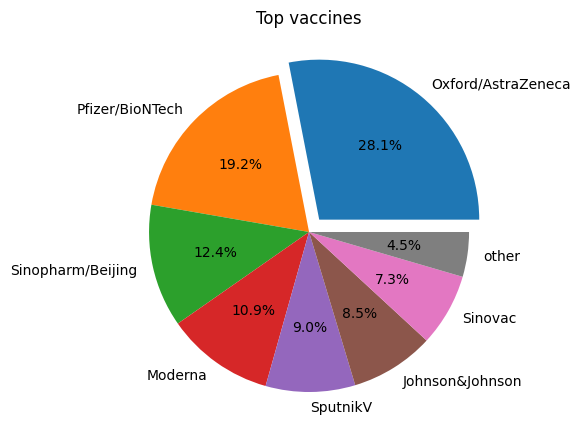

In [23]:
# vaccine single use

# get rid of nan values in vaccine combinations
comb_not_nan = covid_df.dropna(subset=['vaccines'])

#group by country and get the last observation (returns Series with vaccine combinations)
comb_last = comb_not_nan.groupby('country')['vaccines'].last()
display(comb_last)

# apply lambda-f that rids of spaces and separates vaccines by comas
comb_last = comb_last.apply(lambda x: x.replace(' ', '').split(','))
display(comb_last)

# creat an empty dict to fill it via a double loop by vaccine names and their counts
vaccine_dict = {}
for vaccine_lst in comb_last:
    for vaccine in vaccine_lst:
        if vaccine not in vaccine_dict:
            vaccine_dict[vaccine] = 1
        else:
            vaccine_dict[vaccine] +=1
print(vaccine_dict)

# convert the vaccine_dict into a Series and sort it descending
vaccines = pd.Series(vaccine_dict).sort_values(ascending=False)

# put all other vaccines in one category 'other'
vaccines['other'] = vaccines[7:].sum()

# plot a pie for 8 most common
vaccines = vaccines.sort_values(ascending=False)[:8]
fig = plt.figure(figsize=(4,4))
axes = fig.add_axes([0,0,1,1,])
title = plt.title('Top vaccines')
axes.pie(
    x=vaccines,
    labels=vaccines.index,
    autopct='%.1f%%',
    explode=[0.1,0,0,0,0,0,0,0]
);

## more info for your chart

* __axes.set_title()__ — заголовок диаграммы, а также его настройки (например, параметр fontsize отвечает за размер шрифта);
* __axes.set_xlabel()__ — название оси абсцисс;
* __axes.set_ylabel()__ — название оси ординат;
* __axes.set_xticks()__ — установка отметок на оси абсцисс;
* __axes.set_yticks()__ — установка отметок на оси ординат;
* __axes.xaxis.set_tick_params()__ — управление параметрами отметок на оси абсцисс (например, параметр rotation отвечает за поворот отметок в градусах);
* __axes.yaxis.set_tick_params()__ — управление параметрами отметок на оси ординат;
* __axes.legend()__ — отображение легенды;
* __axes.grid()__ — установка сетки.

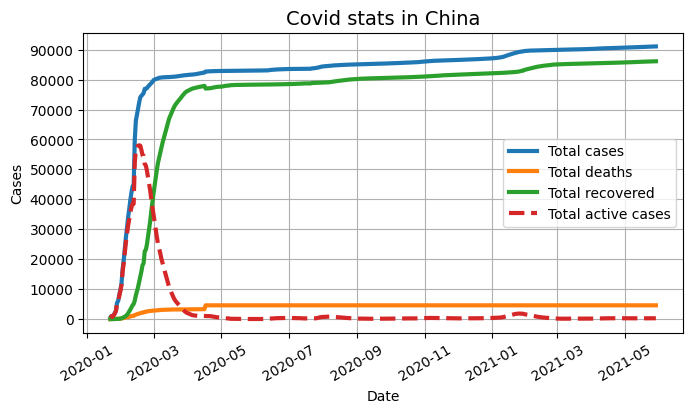

In [24]:
# Например, изобразим на одном графике, как росла общая заболеваемость (confirmed), 
# число зафиксированных смертей (deaths), выздоровевших пациентов (recovered) и активных случаев (active) в Китае.

china_covid = covid_df[covid_df['country'] == 'China']
china_grouped = china_covid.groupby('date')[['confirmed', 'active', 'deaths', 'recovered']].sum()

fig = plt.figure(figsize=(6,3))
axes = fig.add_axes([0,0,1,1])
axes.plot(china_grouped['confirmed'], label='Total cases', lw=3)
axes.plot(china_grouped['deaths'], label='Total deaths', lw=3)
axes.plot(china_grouped['recovered'], label='Total recovered', lw=3)
axes.plot(china_grouped['active'], label='Total active cases', lw=3, linestyle='dashed')

axes.set_title('Covid stats in China', fontsize=14)
axes.set_xlabel('Date')
axes.set_ylabel('Cases')
axes.set_yticks(range(0, 100000, 10000))
axes.xaxis.set_tick_params(rotation=30)
axes.grid()
axes.legend();



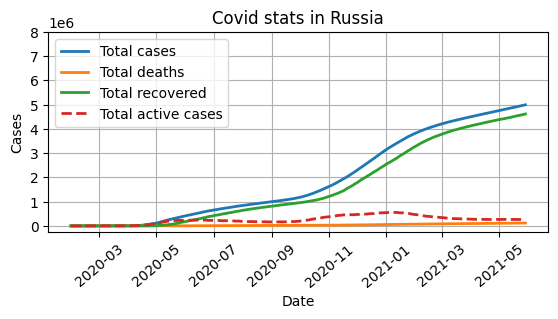

In [25]:
# same for Russia
russia_covid = covid_df[covid_df['country'] == 'Russia']
russia_grouped = russia_covid.groupby('date')[['confirmed', 'deaths', 'active', 'recovered']].sum()

fig = plt.figure(figsize=(5,2))
axes = fig.add_axes([0,0,1,1])
axes.plot(russia_grouped['confirmed'], label='Total cases', lw=2)
axes.plot(russia_grouped['deaths'], label='Total deaths', lw=2)
axes.plot(russia_grouped['recovered'], label='Total recovered', lw=2)
axes.plot(russia_grouped['active'], label='Total active cases', lw=2, linestyle='dashed')

axes.set_title('Covid stats in Russia')
axes.set_xlabel('Date')
axes.set_ylabel('Cases')
axes.set_yticks(range(0, 9000000, 1000000))
axes.xaxis.set_tick_params(rotation=40)
axes.legend()
axes.grid();

country,Russia,United States
date,,
2020-01-22,NaN,0.0
2020-01-23,NaN,0.0
2020-01-24,NaN,0.0
2020-01-25,NaN,0.0
2020-01-26,NaN,0.0
...,...,...
2021-05-25,117197.0,590941.0
2021-05-26,117595.0,591950.0
2021-05-27,117990.0,593288.0


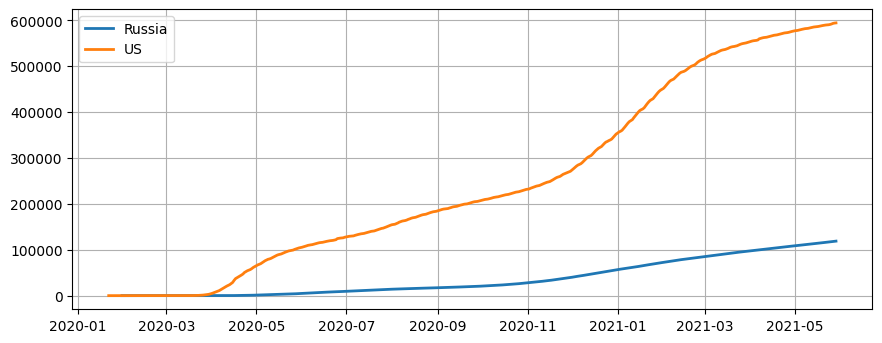

In [26]:
# death rate comparison US, China and Rissia.
mask = (covid_df['country'] == 'Russia') | (covid_df['country'] == 'United States')
compared_deaths = covid_df[mask].pivot_table(values='deaths', index='date', columns='country')
display(compared_deaths)

fig = plt.figure(figsize=(8,3))
axes = fig.add_axes([0,0,1,1])
axes.plot(compared_deaths['Russia'], label='Russia', lw=2)
axes.plot(compared_deaths['United States'], label='US', lw=2)
axes.grid()
axes.legend()

In [27]:
# to filter out more than one value

compare = ['United States', 'China', 'Russia']
cropped_covid = covid_df[covid_df['country'].isin(compare)]

Например, отобразим ТОП-5 стран по общему числу привитых вторым компонентом людей (people_fully_vaccinated), а также ТОП-5 стран по числу полностью привитых на 100 человек населения (people_fully_vaccinated_per_hundred).

''

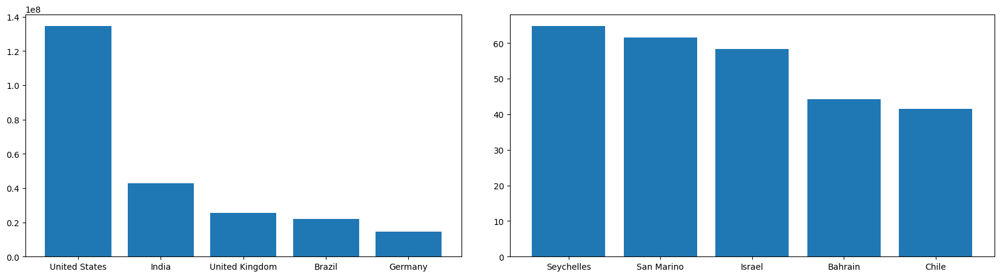

In [28]:
vaccinated = covid_df.groupby('country')['people_fully_vaccinated'].last().nlargest(5)
vaccinated_per_hundred = covid_df.groupby('country')['people_fully_vaccinated_per_hundred'].last().nlargest(5)

fig = plt.figure(figsize=(8,4))
axes1 = fig.add_axes([0,0, 0.9, 1])
axes2 = fig.add_axes([1.0, 0, 1, 1])
axes1.bar(vaccinated.index, height=vaccinated, label='Vaccinated', lw=2)  
axes2.bar(vaccinated_per_hundred.index, height=vaccinated_per_hundred, label='Vaccinated per hundred', lw=2)


;

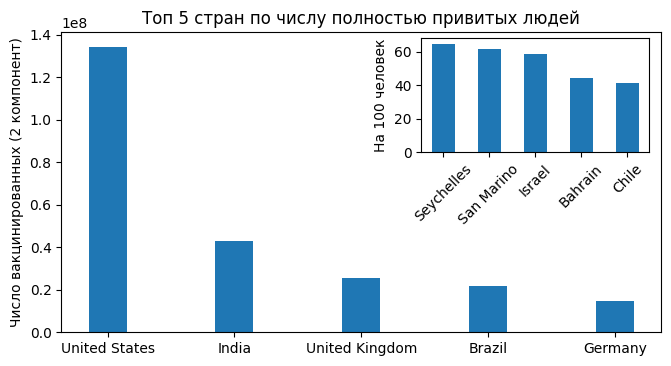

In [29]:
vacc_country = covid_df.groupby('country')['people_fully_vaccinated'].last().nlargest(5)
vacc_country_per_hundred = covid_df.groupby('country')['people_fully_vaccinated_per_hundred'].last().nlargest(5)

#визуализация главного графика
fig = plt.figure(figsize=(6, 3))
main_axes = fig.add_axes([0, 0, 1, 1])
main_axes.bar(x = vacc_country.index, height = vacc_country, width=0.3);
main_axes.set_ylabel('Число вакцинированных (2 компонент)')
main_axes.set_title('Топ 5 стран по числу полностью привитых людей')

#визуализация вспомогательного графика
insert_axes = fig.add_axes([0.6, 0.6, 0.38, 0.38])
insert_axes.bar(x = vacc_country_per_hundred.index, height = vacc_country_per_hundred, width=0.5);
insert_axes.set_ylabel('На 100 человек')
insert_axes.xaxis.set_tick_params(rotation=45)

## subplots()

to create more axes on one figure

* __nrows__ — number of rows
* __ncols__ — number of columns
* __figsize__ — width and height of the figure in inches
* __sharex__ & __sharey__ bool or {'none', 'all', 'row', 'col'}, default: False
    True or 'all': x- or y-axis will be shared among all subplots.
    False or 'none': each subplot x- or y-axis will be independent.
    'row': each subplot row will share an x- or y-axis.
    'col': each subplot column will share an x- or y-axis.

    [more info](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.subplots.html)

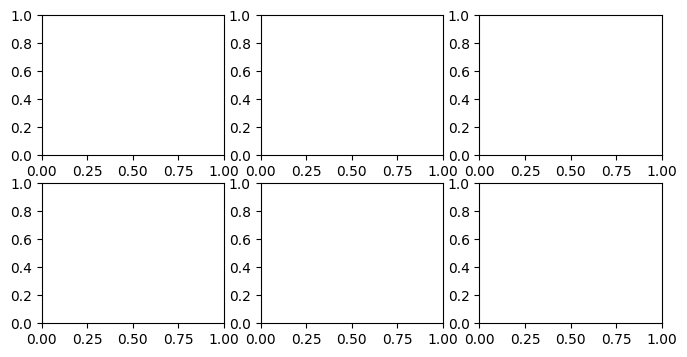

In [30]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(8,4))

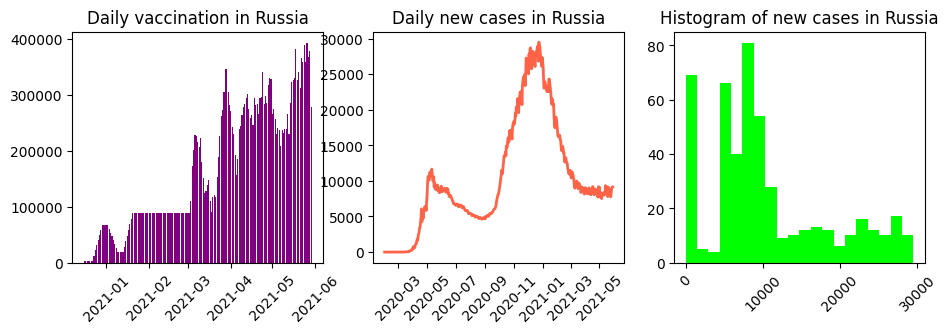

In [31]:
russia_vac = covid_df[covid_df['country'] == 'Russia']

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(11,3))

axes[0].bar(
    x=russia_vac['date'],
    height=russia_vac['daily_vaccinations'],
    label='Vaccinated',
    color='purple'
)
axes[0].set_title("Daily vaccination in Russia")
axes[0].xaxis.set_tick_params(rotation=45)

axes[1].plot(
    russia_vac['date'],
    russia_vac['daily_confirmed'],
    label='New cases',
    color='tomato',
    lw=2
)
axes[1].set_title('Daily new cases in Russia')
axes[1].xaxis.set_tick_params(rotation=45)

axes[2].hist(
    x=russia_vac["daily_confirmed"], 
    label=["New cases"],
    color="lime", 
    bins=20
)
axes[2].set_title('Histogram of new cases in Russia')
axes[2].xaxis.set_tick_params(rotation=45)

## __Visualisation with seaborn__

[more info](http://seaborn.pydata.org/index.html)

### colormaps

[more info](https://matplotlib.org/stable/users/explain/colors/colormaps.html)

In [32]:
print(sns.__version__)


0.13.2


In [33]:
countries = ['Russia', 'Australia', 'Germany', 'Canada', 'United Kingdom']
croped_covid_df = covid_df[covid_df['country'].isin(countries)] # it's a mask

populations = pd.DataFrame([
    ['Canada', 37664517],
    ['Germany', 83721496],
    ['Russia', 145975300],
    ['Australia', 25726900],
    ['United Kingdom', 67802690]
    ],
    columns=['country', 'population']
)

croped_covid_df = croped_covid_df.merge(populations, on=['country'])
croped_covid_df['daily_confirmed_per_hundred'] = croped_covid_df['daily_confirmed'] / croped_covid_df['population'] * 100
croped_covid_df.head()


,date,country,confirmed,deaths,recovered,active,daily_confirmed,daily_deaths,daily_recovered,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines,death_rate,recovery_rate,population,daily_confirmed_per_hundred
0,2020-01-23,Australia,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25726900,NaN
1,2020-01-25,Australia,4.0,0.0,0.0,4.0,4.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,25726900,0.000016
2,2020-01-26,Australia,4.0,0.0,0.0,4.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,25726900,0.000000
3,2020-01-27,Australia,5.0,0.0,0.0,5.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,25726900,0.000004
4,2020-01-28,Australia,5.0,0.0,0.0,5.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,25726900,0.000000


### sns.histplot()

hist in seaborn sns

* __data__ — source DataFrame
* __x__ — column for x
* __y__ — column for y
* __hue__ — semantic variable that is mapped to determine the color of plot element, not recommended to use with histplot, but is used for other visualisation types in Seaborn
* __ax__ — coordinate sys Matplotlib, on which you plot the graph
* __color__ — colour
* __bins__ — number of bins, default is automatic
* __kde__ — If True, computes a kernel density estimate to smooth the distribution and show on the plot as (one or more) line(s). Only relevant with univariate data. defailt=False

[more info](https://seaborn.pydata.org/generated/seaborn.histplot.html)

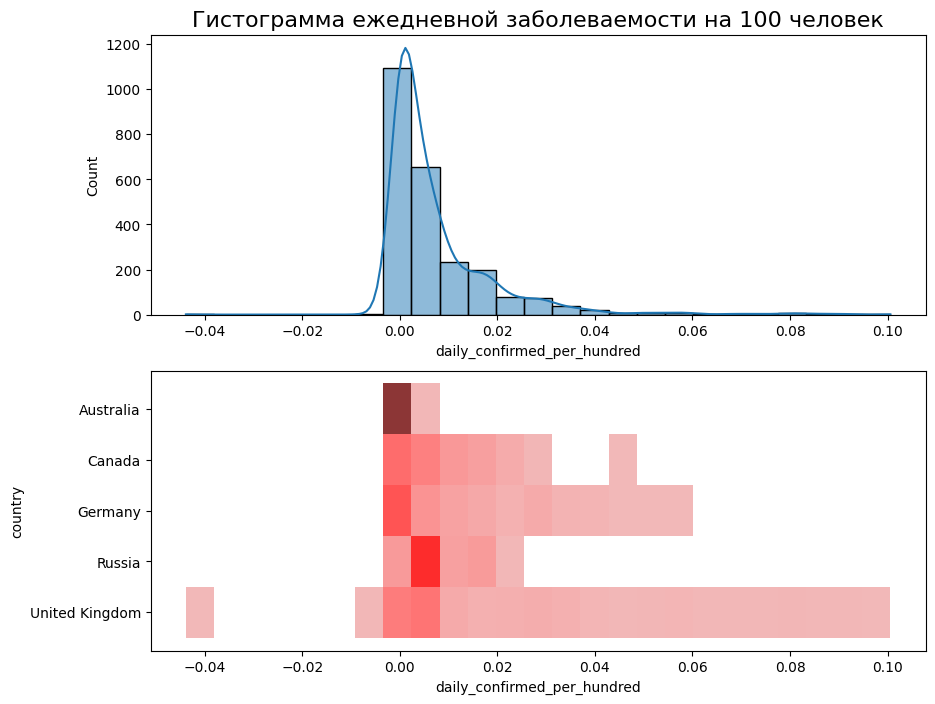

In [34]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10,8))

sns.histplot(
    data=croped_covid_df,
    x='daily_confirmed_per_hundred',
    bins=25,
    kde=True,
    ax=axes[0]
);
axes[0].set_title('Гистограмма ежедневной заболеваемости на 100 человек', fontsize=16)

sns.histplot(
    data=croped_covid_df,
    x='daily_confirmed_per_hundred',
    y='country',
    bins=25,
    color='red',
    ax=axes[1]
);


На самом деле при использовании Seaborn необязательно передавать координатные плоскости в аргументы функций. Графики в библиотеке вполне себе самодостаточны: функции для построения графика возвращают объект Axes из библиотеки Matplotlib, с которыми мы уже умеем работать. Достаточно просто занести результат выполнения функции в переменную и использовать её для настройки графика.

### sns.boxplot()

* __data__ - data to plot
* __x__, __y__ - variables in data
* __orient__ - orientation “v” | “h” | “x” | “y”
* __color__ - colour
* __fill__ - bool, if True use a solid patch
* __width__ - width of the boxes


[more info](https://seaborn.pydata.org/generated/seaborn.boxplot.html)


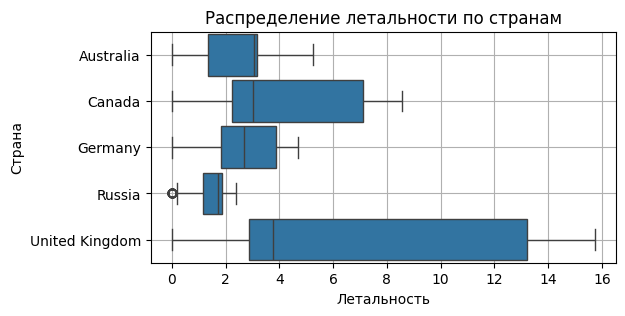

In [35]:
fig = plt.figure(figsize=(6,3))
boxplot = sns.boxplot(
    data=croped_covid_df,
    y='country',
    x='death_rate',
    orient='h',
    width=0.9
)
boxplot.set_title('Распределение летальности по странам');
boxplot.set_xlabel('Летальность');
boxplot.set_ylabel('Страна');
boxplot.grid()


### sns.barplot()

* __data__  - dataset for plotting. If x and y are absent, this is interpreted as wide-form. Otherwise it is expected to be long-form.
* __x, y, hue__ - variables in data or vector data. Inputs for plotting long-form data. 
* _order_, __hue_order__ - lists of strings, order to plot the categorical levels in; otherwise the levels are inferred from the data objects.
* __estimator__ - string or callable that maps vector -> scalar. Statistical function to estimate within each categorical bin. Default = mean.
* __errorbar__ - string, (string, number) tuple, callable or None, Name of errorbar method (either “ci”, “pi”, “se”, or “sd”), or a tuple with a method name and a level parameter, or a function that maps from a vector to a (min, max) interval, or None to hide errorbar. See the errorbar tutorial for more information.
* __orient__ - “v” | “h” | “x” | “y”. Orientation of the plot (vertical or horizontal). This is usually inferred based on the type of the input variables, but it can be used to resolve ambiguity when both x and y are numeric or when plotting wide-form data.
* __color__ - matplotlib color. Single color for the elements in the plot.


[more info](https://seaborn.pydata.org/generated/seaborn.barplot.html)

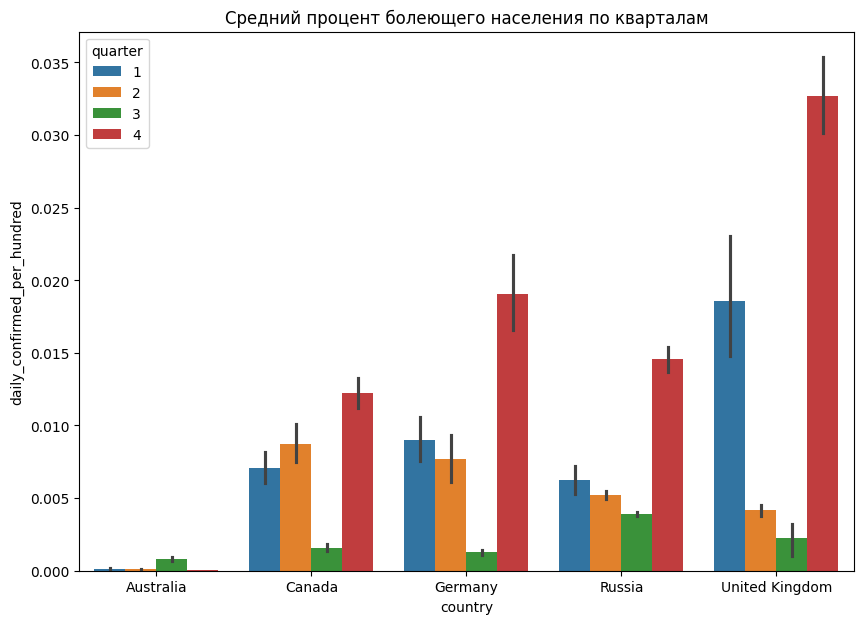

In [36]:
sns.set_palette("tab10")
fig = plt.figure(figsize=(10, 7))
croped_covid_df['quarter'] = croped_covid_df['date'].dt.quarter
barplot = sns.barplot(
    data=croped_covid_df,
    x='country',
    y='daily_confirmed_per_hundred',
    hue='quarter',
    palette='tab10'
)
barplot.set_title('Средний процент болеющего населения по кварталам');



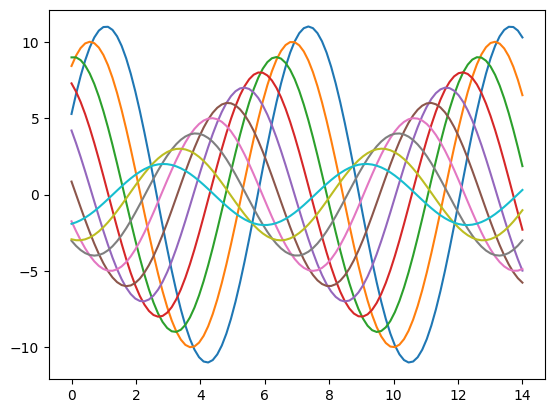

In [37]:
import numpy as np
def sinplot(n=10, flip=1):
    x = np.linspace(0, 14, 100)
    for i in range(1, n + 1):
        plt.plot(x, np.sin(x + i * .5) * (n + 2 - i) * flip)
sinplot()


### sns.joinplot()

combination of a line diagram and scattered dot diagram. It has the following parameters:
* __data__ - DataFrame to plot
* __x__ - values for axis x
* __y__ - values for axis y
* __hue__ grouping categorical value
* __xlim__, __ylim__ - defines the range of values for the axes
* __height__ - defines the height and width of the chart


[more info](https://seaborn.pydata.org/generated/seaborn.jointplot.html)

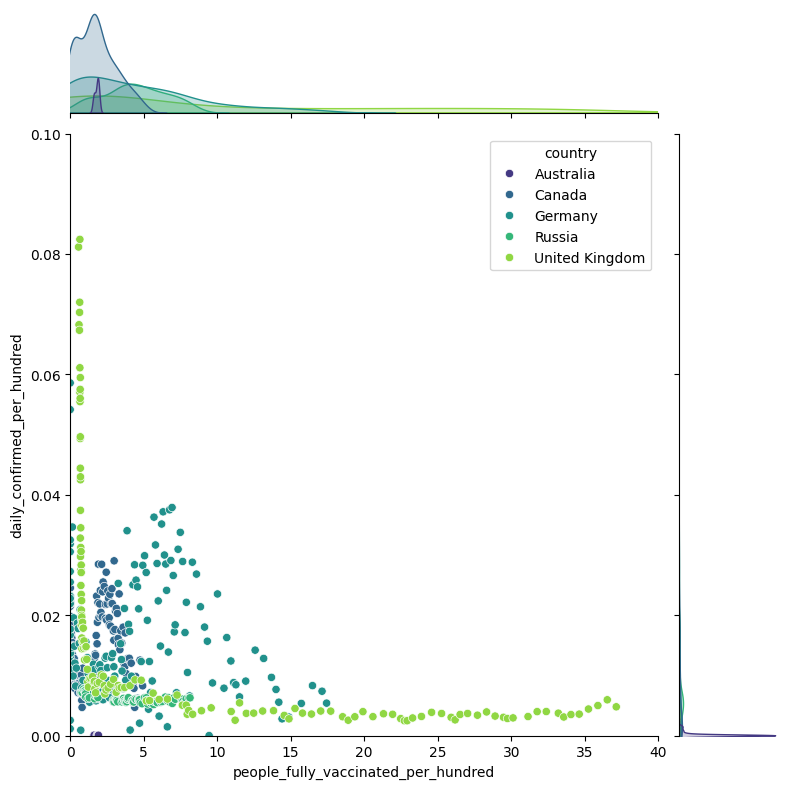

In [38]:
jointplot = sns.jointplot(
    data=croped_covid_df, 
    x='people_fully_vaccinated_per_hundred', 
    y='daily_confirmed_per_hundred',
    hue='country',
    xlim = (0, 40),
    ylim = (0, 0.1),
    height=8,
    palette='viridis'
)

### heatmap()

* __data__ - data to plot
* __annot__ - legend
* __cmap__ - color palette 

[more info](https://seaborn.pydata.org/generated/seaborn.heatmap.html)

In [39]:
# compare vaccination speed by country
#create a pivot with ppl vaccinated by date and country
pivot = croped_covid_df.pivot_table(
    values='people_vaccinated_per_hundred',
    columns='date',
    index='country',
)
# name of the columns should be string for the heatmap to plot them
pivot.columns = pivot.columns.astype('string')
display(pivot)

date,2020-12-13,2020-12-14,2020-12-15,2020-12-16,2020-12-17,2020-12-18,2020-12-19,2020-12-20,2020-12-21,2020-12-22,...,2021-05-20,2021-05-21,2021-05-22,2021-05-23,2021-05-24,2021-05-25,2021-05-26,2021-05-27,2021-05-28,2021-05-29
country,,,,,,,,,,,,,,,,,,,,,
Australia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,12.40,12.69,12.88,13.28,13.73,14.18
Canada,NaN,0.0,0.00,0.01,0.02,0.03,0.03,0.03,0.05,0.07,...,48.10,49.25,50.14,50.89,51.77,52.39,53.05,53.95,54.99,55.71
Germany,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,39.18,39.68,39.95,40.11,40.29,40.64,41.29,41.87,42.40,42.61
Russia,NaN,NaN,0.02,NaN,NaN,NaN,NaN,NaN,NaN,0.04,...,10.20,10.30,10.50,10.53,10.70,10.81,11.07,11.12,11.19,11.29
United Kingdom,0.13,NaN,NaN,NaN,NaN,NaN,NaN,0.99,NaN,NaN,...,55.01,55.33,55.63,55.82,55.99,56.27,56.61,56.99,57.29,57.56


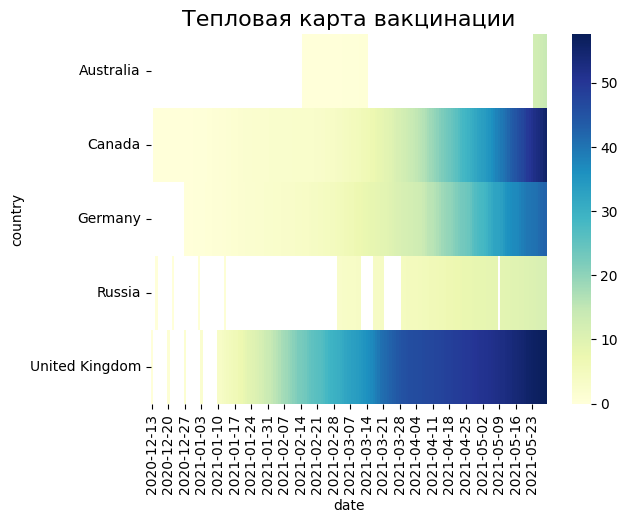

In [40]:
heatmap = sns.heatmap(data=pivot, cmap='YlGnBu')
heatmap.set_title('Тепловая карта вакцинации', fontsize=16);

6.4
confirmed_per_hundred

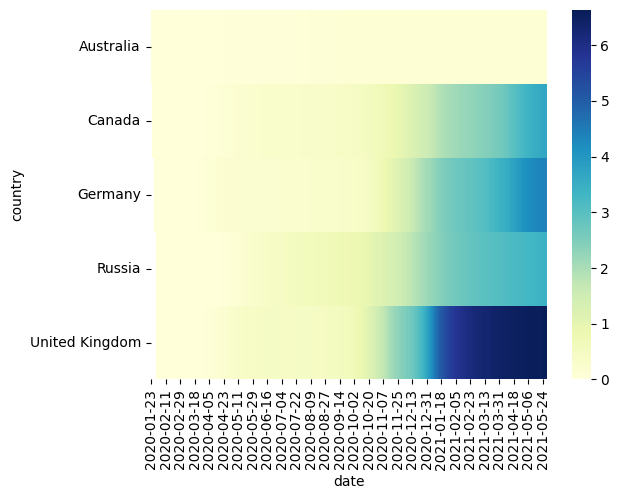

In [41]:
croped_covid_df['confirmed_per_hundred'] = croped_covid_df['confirmed']/croped_covid_df['population']*100
pivot_temp = croped_covid_df.pivot_table(
    values='confirmed_per_hundred',
    columns='date',
    index='country'
)
pivot_temp.columns = pivot_temp.columns.astype('string')

heatmap = sns.heatmap(data=pivot_temp, cmap='YlGnBu')

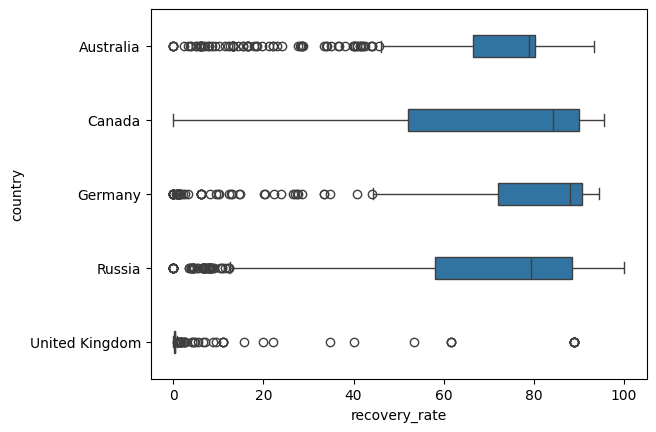

In [45]:

boxplot_rec = sns.boxplot(
    croped_covid_df, 
    x='recovery_rate', 
    y='country', 
    orient='h', 
    width=0.3
    );

# VISUALISATION WITH PLOTLY

interactive graphs, graphs 3D etc 

### plotly.express

* line() — линейные графики
* histogram() — гистограммы
* scatter() — диаграммы рассеяния
* box() — коробчатые диаграммы
* bar() — столбчатые диаграммы
* pie() — круговые диаграммы
...
...
* treemap() - площадная диаргами (как pie только квадратики)
* choropleth() - data on the world map

[basic charts and graphs](https://plotly.com/python/basic-charts/)

[statistical charts](https://plotly.com/python/statistical-charts/)


[more info](https://plotly.com/python/)

In [48]:
import plotly
import plotly.express as px
print(plotly.__version__)

# install Jupyter Notebook Renderers

5.19.0


### __px.line()__

* __data_frame__ — DataFrame, по которому строится график;
* __x__ — признак по оси абсцисс;
* __y__ — признак по оси ординат;
* __height__ — высота графика;
* __width__ — ширина графика;
* __title__ — название графика.

[more info](https://plotly.com/python-api-reference/generated/plotly.express.line)

Create a line graphe (confirmed), (deaths), (recovered) & (active) over the period. Sum the stats per day. To display the fig use __fig.show()__

In [49]:
line_data = covid_df.groupby('date', as_index=False).sum()
fig = px.line(
    data_frame=line_data, #DataFrame
    x='date', #ось абсцисс
    y=['confirmed', 'recovered', 'deaths', 'active'], #ось ординат
    height=500, #высота
    width=1000, #ширина
    title='Confirmed, Recovered, Deaths, Active cases over Time' #заголовок
)
fig.show()

В результате мы получаем график, который позволяет:

получать значения признака в отдельных точках в интерактивном режиме (наведите мышку на точку на графике, чтобы посмотреть информацию о её координатах);
регулировать отображения конкретных признаков с помощью легенды (отключать и включать данные признаки без изменения кода);
увеличивать фрагменты, выделяя их мышкой или приближая колёсиком мышки;
сохранять полученный график в формате PNG напрямую из Jupyter Notebook (нажмите на иконку фотоаппарата рядом с графиком).

### __px.bar()__

* __color__ — grouping parameter, by which the bars will be coloured
* __text__ — text on the bars 
* __orientation__ —  ('v' — vertical, 'h' — horisontal)

[more info](https://plotly.com/python-api-reference/generated/plotly.express.bar)

Create a bargraph top 10 countries by recovery_rate. Use method px.bar() 

In [52]:
#считаем средний процент выздоровлений для каждой страны
bar_data = covid_df.groupby(
    by='country',
    as_index=False
)[['recovery_rate']].mean().round(2).nlargest(10, columns=['recovery_rate'])
display(bar_data)

#строим график
fig = px.bar(
    data_frame=bar_data, #датафрейм
    x="country", #ось x
    y="recovery_rate", #ось y
    color='country', #расцветка в зависимости от страны
    text = 'recovery_rate', #текст на столбцах
    orientation='v', #ориентация графика
    height=500, #высота
    width=1000, #ширина
    title='Top 10 Countries for Recovery Rate' #заголовок
)

#отображаем его
fig.show()

,country,recovery_rate
52,Diamond Princess,94.04
133,Micronesia,93.80
25,Brunei,89.97
120,Macau,87.86
40,China,86.99
127,Marshall Islands,86.92
169,Saint Kitts and Nevis,86.85
143,New Zealand,86.14
91,Iceland,86.09
197,Tajikistan,85.20


### __px.treemap()__

* __data_frame__ — DataFrame to plot;
* __path__ — cathegories by which to plot 
* __values__ — parameter by which the area of the rectangles is defined 

[more info](https://plotly.com/python-api-reference/generated/plotly.express.treemap.html)

treemap for daily_recovered for all countries

In [53]:
#считаем среднее ежедневно фиксируемое количество выздоровевших по странам
treemap_data = covid_df.groupby(
    by='country',
    as_index=False
)[['daily_recovered']].mean()

#строим график
fig = px.treemap(
    data_frame=treemap_data, #DataFrame
    path=['country'], #категориальный признак, для которого строится график
    values='daily_recovered', #параметр, который сравнивается
    height=500, #высота
    width=1000, #ширина
    title='Daily Recovered Cases by Country' #заголовок
)

#отображаем график
fig.show()

### __px.choropleth()__

animated graph, in a choropleth map, each row of data_frame is represented by a colored region mark on a map.



* __data_frame__ — DataFrame to plot
* __locations__ — name of the column with locations (countries, regions etc)
* __locationmode__ — geolocation mode, defines how to match the data to the Plotly map (by  "country_name", or by its 3-letter code RUS, QTR etc, accirding to ISO-3 standard)
* __color__ - which values define the color
* __animation_frame__ - values used to assign marks to animation frames.
* __range_color__ — range of colour change, if provided, overrides auto-scaling on the continuous color scale.
* __color_continuous_scale__ — colour palette.

[more info](https://plotly.com/python-api-reference/generated/plotly.express.choropleth.html)

In [54]:
#преобразуем даты в строковый формат
choropleth_data = covid_df.sort_values(by='date')
choropleth_data['date'] = choropleth_data['date'].astype('string')

#строим график
fig = px.choropleth(
    data_frame=choropleth_data, #DataFrame
    locations="country", #столбец с локациями
    locationmode = "country names", #режим сопоставления локаций с базой Plotly
    color="confirmed", #от чего зависит цвет
    animation_frame="date", #анимационный бегунок
    range_color=[0, 30e6], #диапазон цвета
    title='Global Spread of COVID-19', #заголовок
    width=800, #ширина
    height=500, #высота
    color_continuous_scale='Reds' #палитра цветов
)

#отображаем график
fig.show()

## 3D visualisation

### __px.scatter_3d()__

3d scatter chart with additional parameters
* __z__ — values for z;
* __log_x__ — установка логарифмического масштаба по оси x;
* __log_y__ — установка логарифмического масштаба по оси y.

[more info](https://plotly.com/python-api-reference/generated/plotly.express.scatter_3d)

In [57]:
#фильтруем таблицу по странам
countries=['United States', 'Russia', 'United Kingdom', 'Brazil', 'France']
scatter_data = covid_df[covid_df['country'].isin(countries)]

#строим график
fig = px.scatter_3d(
    data_frame=scatter_data, #DataFrame
    x = 'daily_confirmed', #ось абсцисс
    y = 'daily_deaths', #ось ординат
    z = 'daily_vaccinations', #ось аппликат
    color='country', #расцветка в зависимости от страны
    log_x=True, 
    log_y=True,
    width=1000,
    height=700
)

#отображаем график
fig.show()
fig.write_html("data/plotly/scatter_3D.html") # save the graph as html so I can post it on a website

### __.write_html('relative_path/file_name.html')__

fig.write_html("data/plotly/scatter_3D.html") # save the graph as html so I can post it on a website

7.5 
Daily_vaccinations in time in the world

In [64]:
dv = covid_df.groupby('date', as_index=False)['daily_vaccinations'].sum()
dv_plot = px.line(
    data_frame=dv,
    x='date',
    y='daily_vaccinations',
    height=400,
    width=800,
    title='Daily vaccinations in the world over time'
)

dv_plot.show()

7.6
Постройте анимированную тепловую картограмму для числа поставленных вакцин во всём мире (total_vaccinations). На полученной карте найдите, чему равно количество вакцинированных в Японии (Japan) на 24 марта 2021 года (2021-03-24). Ответ приведите в тысячах (без нулей) и округлите до целого числа.
Примечание. Если в jupyter notebook в VS Code не запускается анимация тепловой карты, попробуйте отобразить график командой fig.show(renderer='notebook').

In [70]:
choropleth2_data = covid_df.sort_values(by='date')
choropleth2_data['date'] = choropleth2_data['date'].astype('string')

chorofig = px.choropleth(
    data_frame=choropleth2_data,
    locations='country',
    locationmode='country names',
    color='total_vaccinations',
    animation_frame='date',
    height=1000,
    width=800,
    title='Total vacciantions over time by country',
    color_continuous_scale='greens'
)
chorofig.show()